# <FONT SIZE = 6> **Proyecto Visión por Computadora**

**Integrantes:**


*   **Laura Valentina Gonzalez**
*   **Dafne Valeria Castellanos**


## **Problemática**

El proyecto se centra en desarrollar un **sistema de recomendación de ropa y accesorios**. La problemática radica en la dificultad que enfrentan los usuarios al buscar productos que se ajusten a sus preferencias y estilo personal en medio de la vasta oferta en línea. Para abordar esta problemática, se propone el uso de técnicas de aprendizaje automático para recomendar prendas y accesorios relevantes según las preferencias del usuario.

<FONT SIZE = 4> **1. Modelo Línea Base: ResNet50 + KNN**

La primera aproximación utiliza una arquitectura de red neuronal convolucional (CNN) llamada ResNet50 para extraer características de las imágenes de productos. Posteriormente, se aplica un algoritmo de vecinos más cercanos (KNN) para realizar las recomendaciones. Durante el proceso de vectorización de imágenes, se utiliza una capa de GlobalMaxPooling2D para reducir la dimensionalidad de los vectores de características, lo que mejora la eficiencia computacional y reduce el tiempo de entrenamiento del modelo KNN. Este enfoque proporciona una línea base sólida para comparar con el modelo avanzado.

<FONT SIZE = 4> **2. Modelo Avanzado: ResNet50 y EfficientNetB7 + Annoy**

El segundo enfoque combina las características extraídas de dos arquitecturas de redes neuronales diferentes: ResNet50 y EfficientNetB7. Las características de ambas redes se combinan mediante una capa de promedio para obtener un vector de características combinado. Este vector se utiliza para realizar recomendaciones utilizando el algoritmo de búsqueda de vecinos más cercanos implementado en Annoy. Esta técnica permite realizar recomendaciones de manera eficiente incluso en conjuntos de datos grandes. La combinación de las dos arquitecturas de redes neuronales ayuda a capturar una representación más rica de las imágenes, lo que potencialmente mejora la calidad de las recomendaciones.

## **Carga y Procesamiento de los Datos**

Primero, se importa varias bibliotecas de Python.

In [4]:
!pip install --q annoy

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import os
os.environ["KAGGLE_USERNAME"] = "lauraval"
os.environ["KAGGLE_KEY"] = "9c5034980a82d9ac36c6b6c039291a3d"

In [7]:
import tensorflow
import pandas as pd
import numpy as np
import tensorflow as tf
import cv2
import random
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import requests
import io

from PIL import Image
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.layers import GlobalMaxPooling2D, Dense, Average
from tensorflow.keras.models import Sequential
from numpy.linalg import norm
from sklearn.neighbors import NearestNeighbors
from keras.models import Model
from tqdm import tqdm
from kaggle.api.kaggle_api_extended import KaggleApi
from annoy import AnnoyIndex
from tensorflow.keras.applications import resnet50, efficientnet
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

Se utiliza la API de Kaggle para autenticarse y descargar un conjunto de datos de imágenes de productos de moda desde la plataforma.

In [8]:
api = KaggleApi()
api.authenticate()
url = "paramaggarwal/fashion-product-images-small"
api.dataset_download_files(url, path="fashion", unzip=True)

Dataset URL: https://www.kaggle.com/datasets/paramaggarwal/fashion-product-images-small


Lee y almacena las rutas de las imágenes descargadas en una lista, y las mezcla aleatoriamente para garantizar la diversidad en el procesamiento posterior.

In [14]:
img_files = []

for fashion_images in os.listdir('fashion/images'):
    images_path = os.path.join('fashion/images', fashion_images)
    img_files.append(images_path)

random.shuffle(img_files)

img_paths = []

for files in tqdm(img_files):
    img_paths.append(files)

100%|██████████| 44441/44441 [00:00<00:00, 2590278.96it/s]


## **Funciones auxiliares para ambos modelos.**

La función `process_path(file_path)` toma la ruta de un archivo de imagen como entrada y realiza una serie de operaciones para preparar la imagen para su procesamiento por un modelo de red neuronal. Lee el archivo de imagen, lo decodifica en formato JPEG con tres canales de color, lo redimensiona a una dimensión específica (en este caso, 224x224 píxeles) y finalmente lo preprocesa para adaptarlo a la entrada del modelo de red neuronal.

La función `download_image_from_url(url, save_path)` descarga una imagen desde una URL y la guarda en una ubicación específica. Realiza una solicitud HTTP GET a la URL proporcionada, abre la imagen descargada en formato de objeto de imagen utilizando la biblioteca PIL y luego la guarda en la ubicación especificada.

La función `extract_img_features(img_path, model)` extrae características de una imagen dada su ruta de archivo utilizando un modelo de red neuronal preentrenado. Carga la imagen utilizando la biblioteca Keras en un tamaño específico (224x224 píxeles), convierte la imagen en un array NumPy, expande las dimensiones del array para que coincidan con las dimensiones requeridas por el modelo de red neuronal, preprocesa la imagen para adaptarla a la entrada del modelo de red neuronal, utiliza el modelo proporcionado para predecir las características de la imagen, y finalmente aplana y normaliza las características resultantes para su posterior procesamiento o análisis.

In [15]:
def process_path(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [224, 224])
    img = preprocess_input(img)
    return img

def download_image_from_url(url, save_path):
    response = requests.get(url)
    image = Image.open(io.BytesIO(response.content))
    image.save(save_path)
    return save_path

def extract_img_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    expand_img = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expand_img)
    result_to_resnet = model.predict(preprocessed_img)
    flatten_result = result_to_resnet.flatten()
    result_normalized = flatten_result / norm(flatten_result)
    return result_normalized

## **Modelo Línea Base: ResNet50 + KNN**

En este enfoque de línea base, utilizamos la arquitectura de red neuronal convolucional ResNet50 para extraer características de las imágenes de productos. ResNet50 es conocida por su profundidad y capacidad para capturar características de alto nivel en imágenes. Después de extraer las características, aplicamos el algoritmo de vecinos más cercanos (KNN) para realizar recomendaciones.

El proceso implica lo siguiente:

* Utilizamos ResNet50 para extraer características de las imágenes de productos.
* Aplicamos una capa de GlobalMaxPooling2D para reducir la dimensionalidad de los vectores de características.
* Entrenamos un modelo KNN utilizando los vectores de características obtenidos.
* Para realizar recomendaciones, calculamos los vecinos más cercanos de un vector de consulta utilizando el modelo KNN.



### **ResNet50**

La función `imgs_to_vectors` toma rutas de imágenes, las convierte en vectores de características utilizando un modelo preentrenado y devuelve estos vectores. Utiliza un dataset para cargar las imágenes, las procesa en lotes y las pasa al modelo para inferir características. Luego, normaliza y agrega los vectores resultantes a una lista que se devuelve como un array NumPy.







In [16]:
def imgs_to_vectors(img_paths, model, batch_size=32):
    # Crear un dataset desde las rutas de las imágenes
    path_ds = tf.data.Dataset.from_tensor_slices(img_paths)

    # Mapear las rutas a imágenes preprocesadas
    image_ds = path_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Configurar el dataset para batches
    image_ds = image_ds.batch(batch_size)
    image_ds = image_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    all_vectors = []
    for batch in image_ds:
        result_to_resnet = model.predict(batch)
        for result in result_to_resnet:
            flatten_result = result.flatten()
            result_normalized = flatten_result / norm(flatten_result)
            all_vectors.append(result_normalized)

    return np.array(all_vectors)

Se hace la creación del modelo.

In [17]:
model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
model.trainable = False
model = Sequential([model, GlobalMaxPooling2D()])

94765736/94765736 [==============================] - 0s 0us/step


Y se obtienen los vectores.

In [18]:
vectors = imgs_to_vectors(img_paths, model, batch_size=64)

1/1 [==============================] - 2s 2s/step


### **KNN**

Se crea un objeto KNN con los parámetros deseados, como el número de vecinos a considerar, el algoritmo de cálculo y la métrica de distancia. Se ajusta este modelo a los vectores de características extraídos anteriormente.

La función `evaluar_idx_KNN(idx, n_neighbors=6)` toma un índice de referencia y busca los vecinos más cercanos utilizando el modelo KNN. Luego, muestra las imágenes correspondientes a estos vecinos más cercanos en una cuadrícula para su visualización.

Se genera una lista de índices aleatorios y se itera sobre ellos para evaluar y visualizar los vecinos más cercanos para cada uno de ellos utilizando la función mencionada anteriormente.

Indices aleatorios: 32879
[32879 27531 14562 31957  7601 34517]


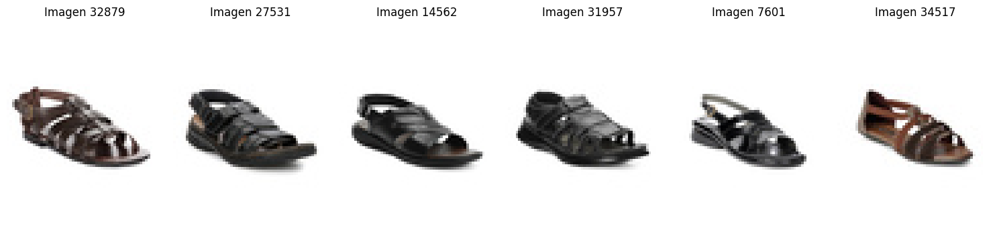

Indices aleatorios: 19713
[19713 30878 24408   964 39272 11395]


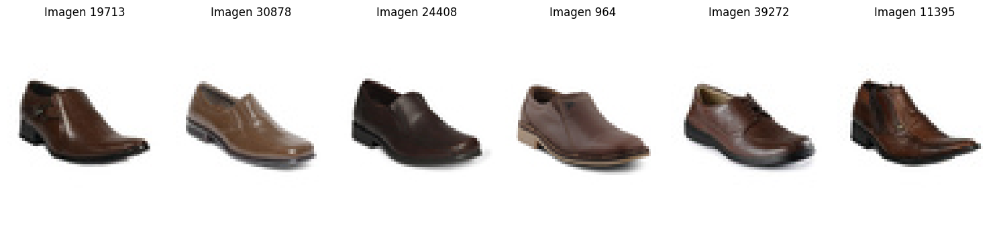

Indices aleatorios: 27005
[27005 44230 12134 11548  9869  2942]


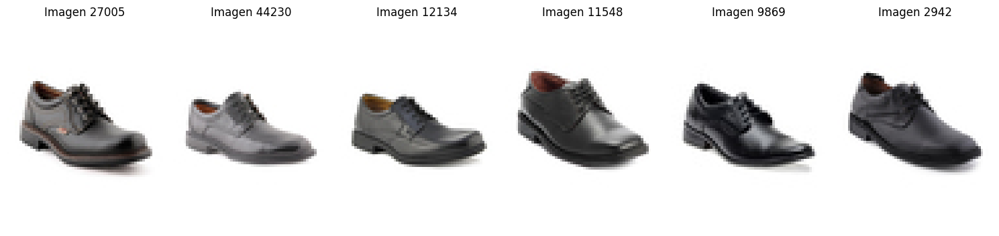

Indices aleatorios: 4901
[ 4901 44312 12744 22630 13889 20801]


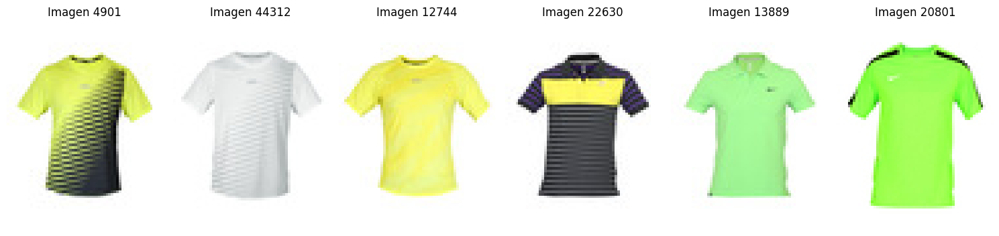

Indices aleatorios: 11808
[11808 42694 17872 25355 22911  4021]


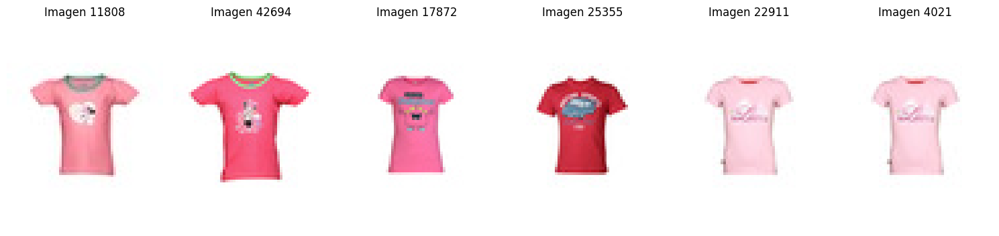

Indices aleatorios: 4606
[ 4606 40670 42916 29859 36733 21326]


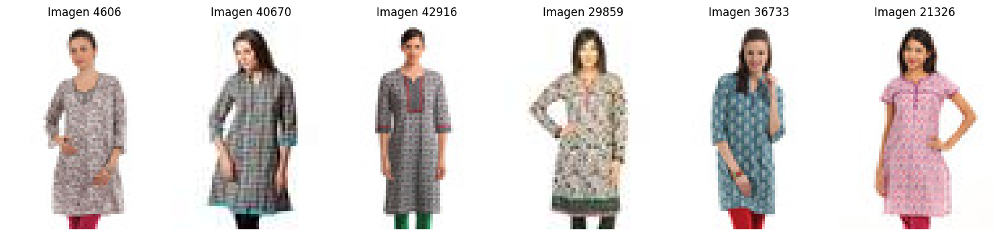

Indices aleatorios: 9722
[ 9722 30885  3715  3688 13122  4765]


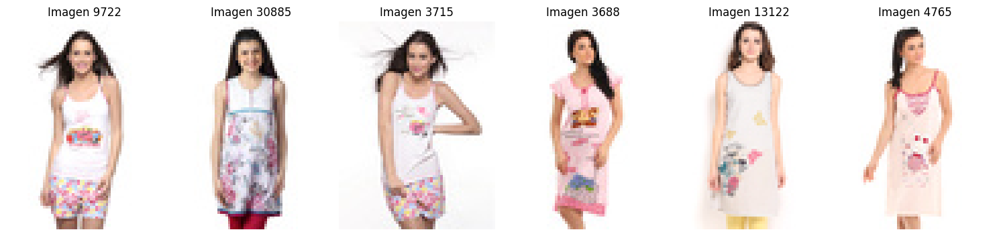

Indices aleatorios: 31725
[31725 15822  4952  9585 22580 12600]


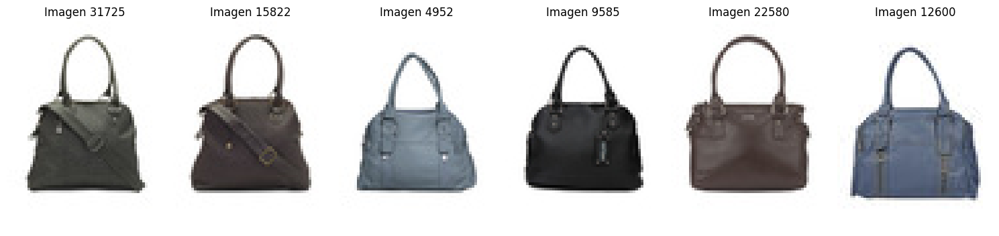

Indices aleatorios: 16029
[16029 20276 30856 39757 16570 16049]


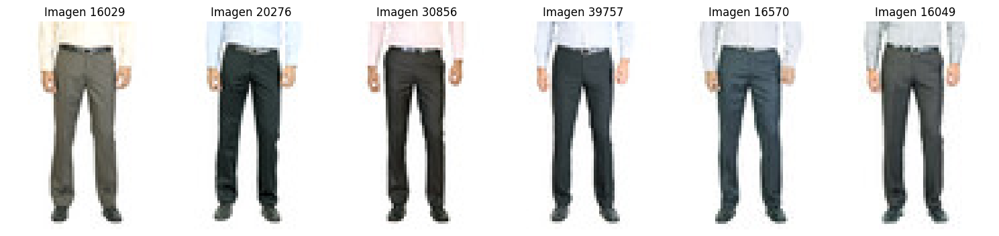

Indices aleatorios: 10724
[10724 18965 40710  1667 27965 32692]


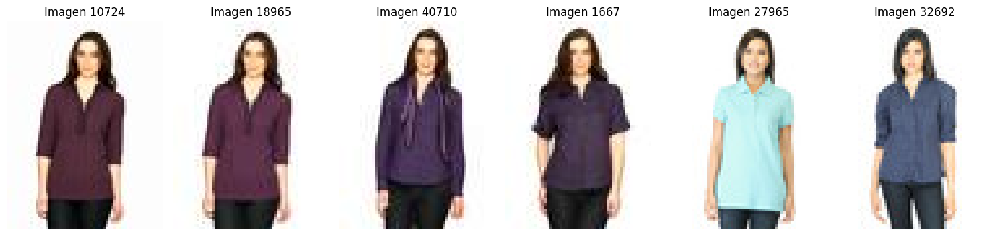

Indices aleatorios: 34899
[34899 31344 30357 28368 15853 14581]


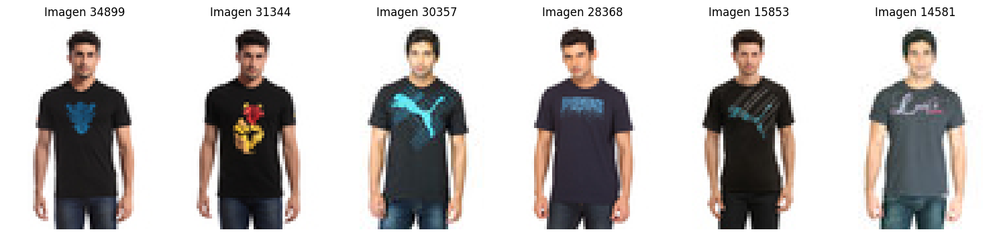

Indices aleatorios: 27846
[27846 40827 13547  4807  3731   734]


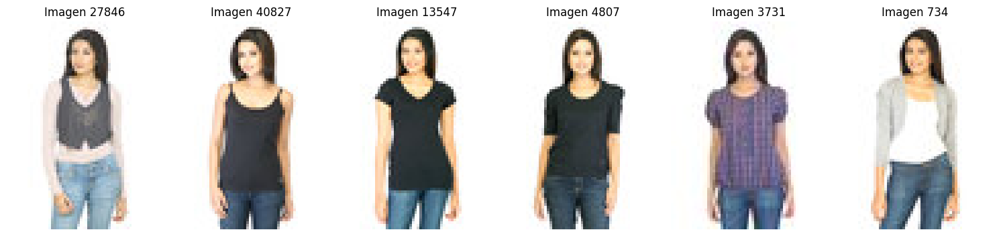

Indices aleatorios: 34267
[34267 13773 34293 18573 38991 26693]


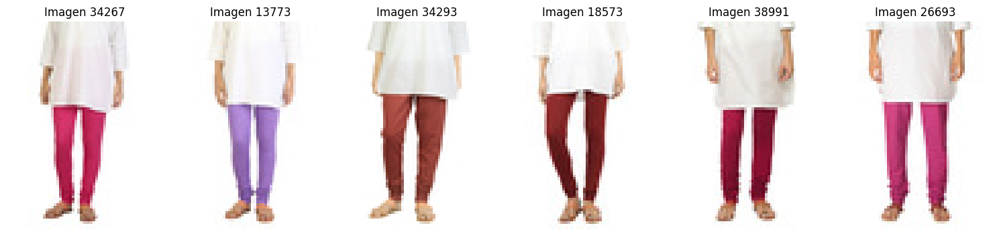

Indices aleatorios: 44387
[44387 21177 29565 12620 34581 36584]


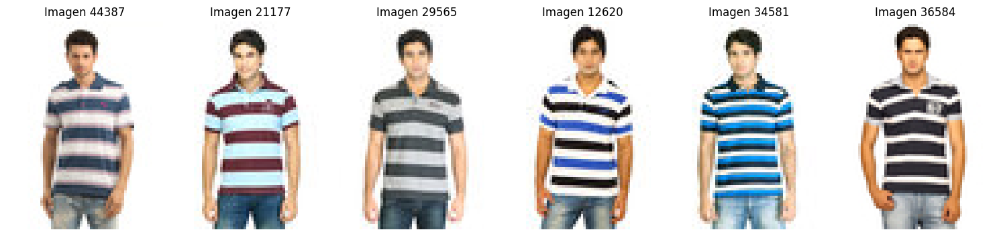

Indices aleatorios: 4400
[ 4400  5039 39752  2919 34654 13179]


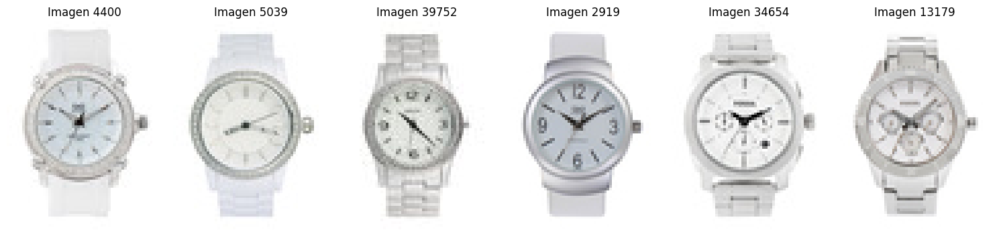

Indices aleatorios: 25373
[25373 27564 18228 38580 41030 42993]


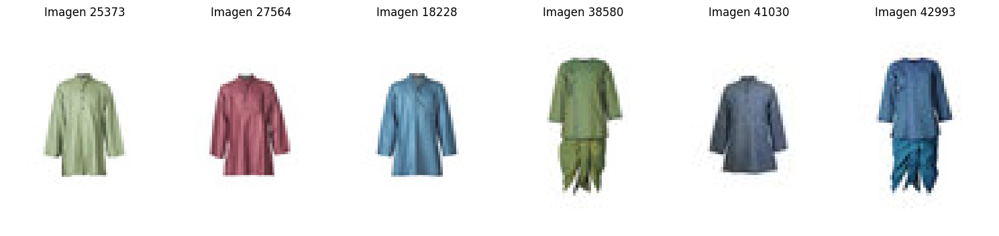

Indices aleatorios: 10968
[10968 10828  5918 36822 12656  5152]


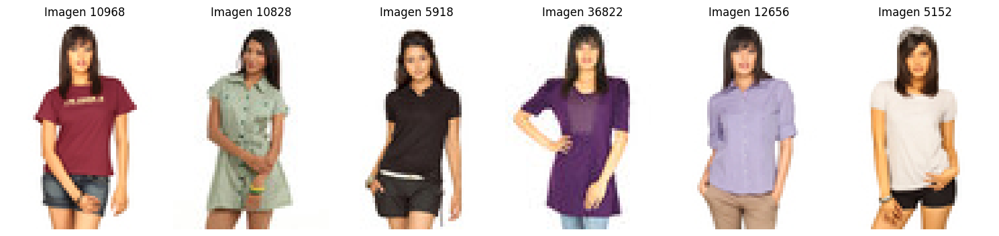

Indices aleatorios: 2228
[ 2228 13768 19868  4402  1606 11125]


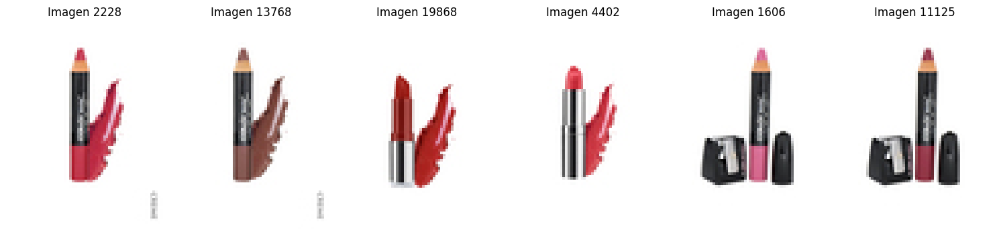

Indices aleatorios: 22472
[22472 24489  9264 23879  9957 14564]


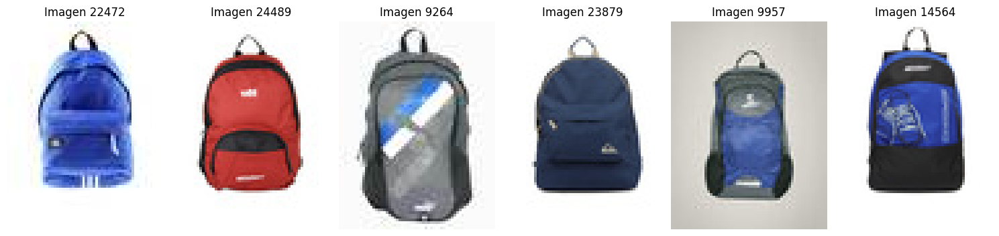

Indices aleatorios: 26120
[26120  9052    47 37266 28348 15341]


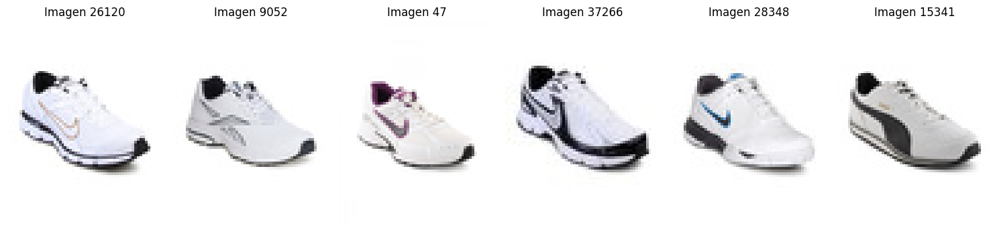

In [20]:
knn = NearestNeighbors(n_neighbors=6, algorithm='auto', metric='euclidean')
knn.fit(vectors)

def evaluar_idx_KNN(idx, n_neighbors=6):
    vector_query = vectors[idx].reshape(1, -1)
    distances, indices = knn.kneighbors(vector_query, n_neighbors)
    nearest_neighbors = indices[0]
    print(nearest_neighbors)
    num_cols = n_neighbors
    num_rows = (n_neighbors + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5))
    for i, ax in zip(nearest_neighbors, axes.flat):
        img = mpimg.imread(img_paths[i])
        ax.imshow(img)
        ax.set_title(f"Imagen {i}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Generar una lista de índices aleatorios
idxs_list_KNN = [random.randint(0, len(vectors) - 1) for _ in range(20)]

for idxs in idxs_list_KNN:
    print("Indices aleatorios:", idxs)
    evaluar_idx_KNN(idxs)

### **Con una imagen externa**

La función `evaluar_img_path_KNN`, evalúa un modelo KNN utilizando una imagen externa como consulta. Primero, verifica si la ruta de la imagen es una URL y la descarga si es necesario. Luego, extrae las características de la imagen de consulta y busca los vecinos más cercanos usando el modelo KNN. Finalmente, muestra la imagen de consulta y las imágenes de los vecinos más cercanos en una cuadrícula utilizando Matplotlib.

In [21]:
def evaluar_img_path_KNN(img_path_or_url, knn_model, vectors, img_paths, n_neighbors=6):
    if img_path_or_url.startswith('http://') or img_path_or_url.startswith('https://'):
        img_path = '/content/downloaded_image.jpg'
        download_image_from_url(img_path_or_url, img_path)
    else:
        img_path = img_path_or_url

    vector_query = extract_img_features(img_path, model).reshape(1, -1)
    distances, indices = knn_model.kneighbors(vector_query, n_neighbors)
    nearest_neighbors = indices[0]
    print(nearest_neighbors)

    num_cols = n_neighbors
    num_rows = (n_neighbors + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5))

    # Mostrar la imagen externa primero
    ax = axes.flat[0]
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title("Imagen Externa")
    ax.axis('off')

    # Mostrar las imágenes recomendadas
    for i, ax in zip(nearest_neighbors, axes.flat[1:]):  # Empezar desde el segundo subplot
        img = mpimg.imread(img_paths[i])
        ax.imshow(img)
        ax.set_title(f"Imagen {i}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

1/1 [==============================] - 1s 529ms/step
[ 5363 38923 19522 19266  9723 21461]


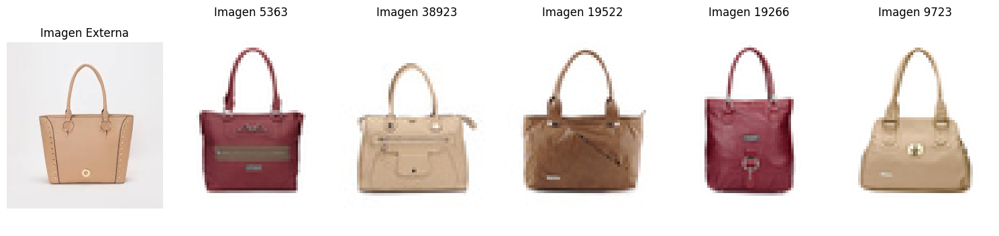

In [22]:
# @title ¡Prueba con tu imagen!
img_path = "/content/drive/MyDrive/proyecto_vision/bolso.jpeg" # @param {type:"string"}
evaluar_img_path_KNN(img_path, knn, vectors, img_paths)

1/1 [==============================] - 0s 28ms/step
[37408   419 40199 31294 20187  6748]


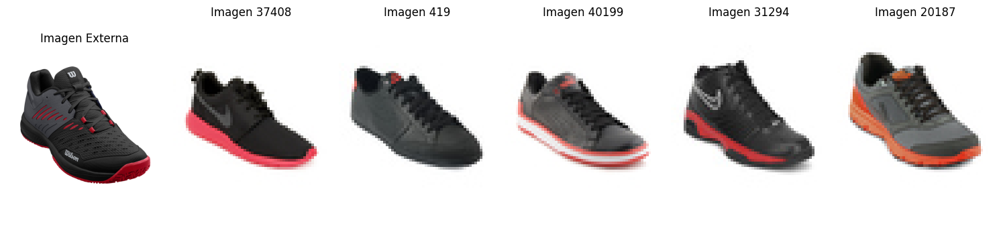

In [23]:
# @title ¡Prueba con tu imagen!
img_path = "https://locatelcolombia.vtexassets.com/arquivos/ids/342195/image-dac41845770346efbc227c4919f9a737.jpg?v=638240841801200000" # @param {type:"string"}
evaluar_img_path_KNN(img_path, knn, vectors, img_paths)

1/1 [==============================] - 0s 27ms/step
[10686 35790 20876 27496 31974  1673]


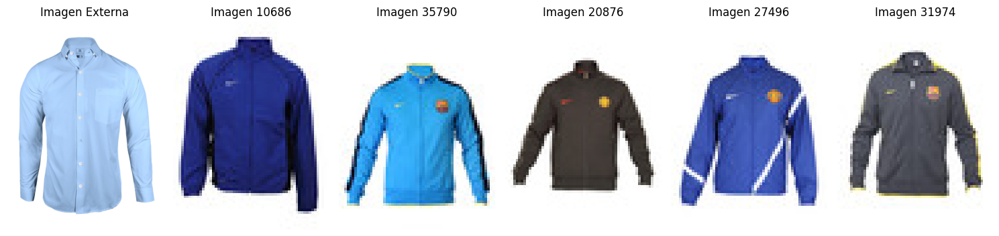

In [24]:
# @title ¡Prueba con tu imagen!
img_path = "https://monarca.com.co/wp-content/uploads/2023/11/016445DELBLU.jpg" # @param {type:"string"}
evaluar_img_path_KNN(img_path, knn, vectors, img_paths)

## **Modelo Avanzado: ResNet50 y Efficient Net + Annoy**

Se utilizaron dos modelos de redes neuronales pre-entrenados, ResNet50 y EfficientNetB7, para extraer las características de las imágenes. Ambos modelos se truncaron después de sus capas convolucionales (especificado por `include_top=False`), y luego se agregaron capas adicionales.

Después de las capas convolucionales, se añadiaron capas de global max pooling y una capa densa con 1024 unidades en cada modelo. Esto se hizo para reducir la dimensionalidad de las características extraídas y obtener representaciones más compactas y ricas de las imágenes.

La función `imgs_to_vectors_combined` utiliza estos modelos para predecir características de lotes de imágenes y luego combina las características obtenidas de ambos modelos. La combinación de características se realiza tomando la media de las características extraídas por ambos modelos. Esto se hace para fusionar la información extraída por cada modelo y obtener una representación combinada de las imágenes que se espera que capture características importantes de manera más completa y robusta.

### **ResNet50 y Efficient Net**

Se crean los modelos.

In [25]:
resnet = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
resnet.trainable = False
resnet = Sequential([resnet, GlobalMaxPooling2D(), Dense(1024)])

efnet = EfficientNetB7(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
efnet.trainable = False
efnet = Sequential([efnet, GlobalMaxPooling2D(), Dense(1024)])

258076736/258076736 [==============================] - 2s 0us/step


Se crea la función, `imgs_to_vectors_combined`, convierte una lista de rutas de imágenes en vectores de características combinados utilizando dos modelos preentrenados: ResNet y EfficientNet. Primero, crea un dataset a partir de las rutas de las imágenes y las mapea a imágenes preprocesadas. Luego, configura el dataset para agrupar las imágenes en lotes y para prefetching para mejorar la eficiencia.

A continuación, para cada lote de imágenes, preprocesa las imágenes para los modelos ResNet y EfficientNet, y obtiene las predicciones de características de cada modelo. Luego, combina los resultados de ambos modelos tomando la media. Finalmente, aplanar y normalizar los resultados combinados antes de agregarlos a una lista que se devuelve como un array NumPy de vectores de características.

In [26]:
def imgs_to_vectors_combined(img_paths, resnet_model, efnet_model, batch_size=32):
    # Crear un dataset desde las rutas de las imágenes
    path_ds = tf.data.Dataset.from_tensor_slices(img_paths)

    # Mapear las rutas a imágenes preprocesadas
    image_ds = path_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Configurar el dataset para batches
    image_ds = image_ds.batch(batch_size)
    image_ds = image_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    all_vectors = []
    for batch in image_ds:
        # Preprocesar para ResNet y EfficientNet
        preprocessed_batch_resnet = resnet50.preprocess_input(batch)
        preprocessed_batch_efnet = efficientnet.preprocess_input(batch)

        # Obtener predicciones para cada modelo
        result_resnet = resnet_model.predict(preprocessed_batch_resnet)
        result_efnet = efnet_model.predict(preprocessed_batch_efnet)

        # Combinar los resultados de ambos modelos
        combined_result = np.mean([result_resnet, result_efnet], axis=0)

        # Aplanar y normalizar cada resultado combinado
        for result in combined_result:
            flatten_result = result.flatten()
            result_normalized = flatten_result / norm(flatten_result)
            all_vectors.append(result_normalized)

    return np.array(all_vectors)

Se obtienen los vectores.

In [27]:
img_vector_2 = imgs_to_vectors_combined(img_paths, resnet, efnet, batch_size=64)

1/1 [==============================] - 5s 5s/step


### **Annoy de 45**

Se crea un índice Annoy para realizar búsquedas aproximadas de vecinos más cercanos en un espacio euclidiano de dimensiones definido por `dimension`, equivalente a los `1024` de la capa Dense. Luego, agrega los vectores de características `img_vector_2` al índice Annoy, asignando a cada vector un identificador único proporcionado por i.

Finalmente, construye el índice especificando el número de árboles que se utilizarán para la búsqueda. En este caso, se han utilizado 45 árboles para construir el índice, correspondiente a las 45 diferentes clases del dataset.

In [109]:
dimension = len(img_vector_2[0])
index_45 = AnnoyIndex(dimension, 'euclidean')
for i, vector in enumerate(img_vector_2):
    index_45.add_item(i, vector)
index_45.build(45)

True

In [110]:
#index_45.save('/content/drive/MyDrive/proyecto_vision/index_45.ann')
#index_2.load('/content/drive/MyDrive/proyecto_vision/index_2.ann')

True

#### **Verificar con imágenes del dataset.**

Se utiliza la función, `evaluar_idx_2`, encuentra los vecinos más cercanos a un vector de consulta específico utilizando un índice Annoy. Primero, obtiene el vector de características de la imagen de consulta. Luego, utiliza el índice Annoy para encontrar los vecinos más cercanos al vector de consulta. Finalmente, muestra las imágenes de los vecinos más cercanos en una cuadrícula utilizando Matplotlib.

In [70]:
def evaluar_idx_2(index_2, idx, n_neighbors=6, verbose=1):
    vector_query = img_vector_2[idx]
    nearest_neighbors = index_2.get_nns_by_vector(vector_query, n_neighbors)
    if (verbose !=0):
        print("Indices aleatorios", idx)
        print("Vecinos más cercanos: ", nearest_neighbors)
    num_cols = n_neighbors
    num_rows = (n_neighbors + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5))
    for i, ax in zip(nearest_neighbors, axes.flat):
        img = mpimg.imread(img_files[i])
        ax.imshow(img)
        ax.set_title(f"Imagen {i}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

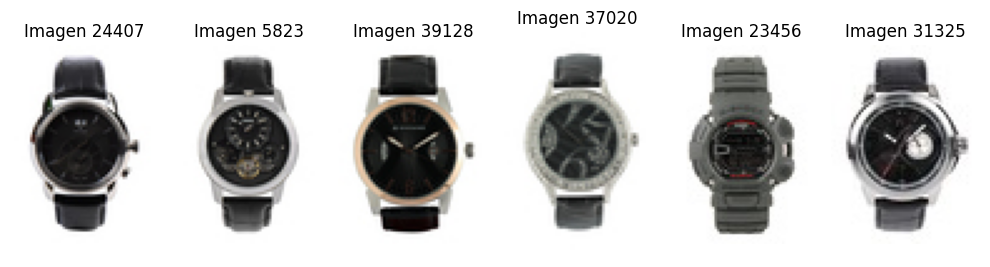

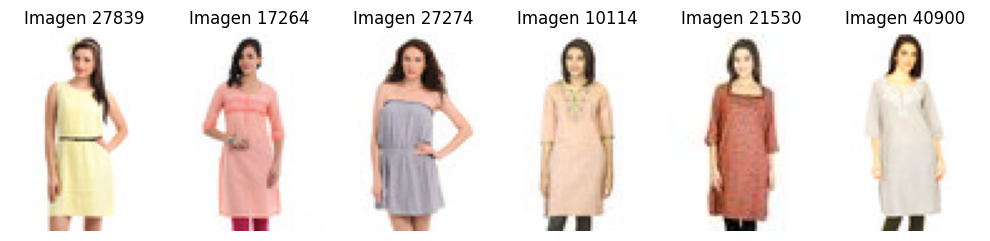

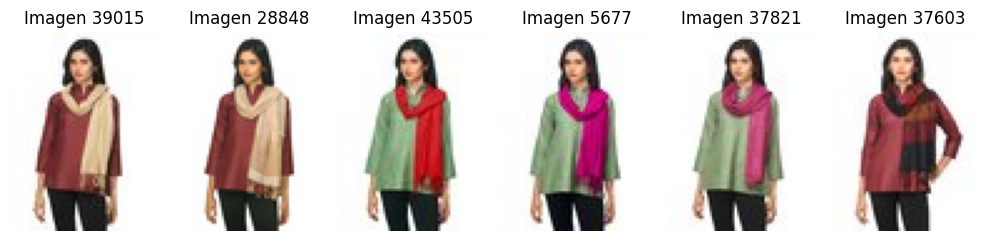

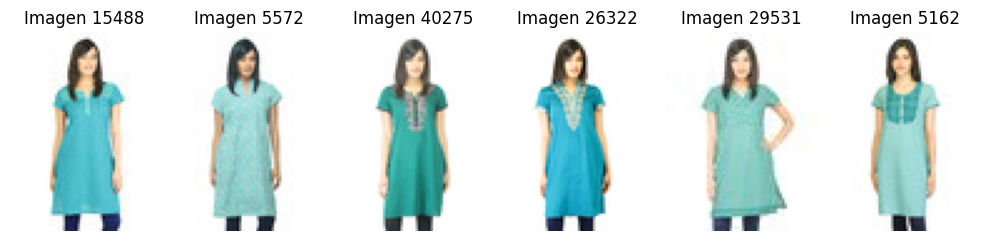

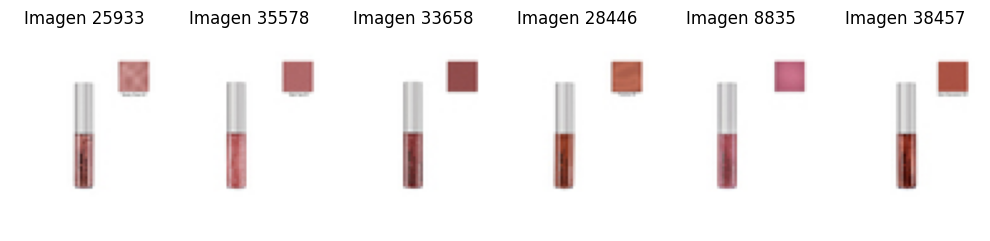

...

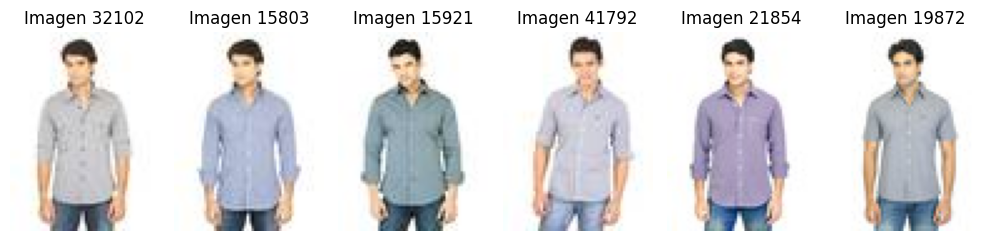

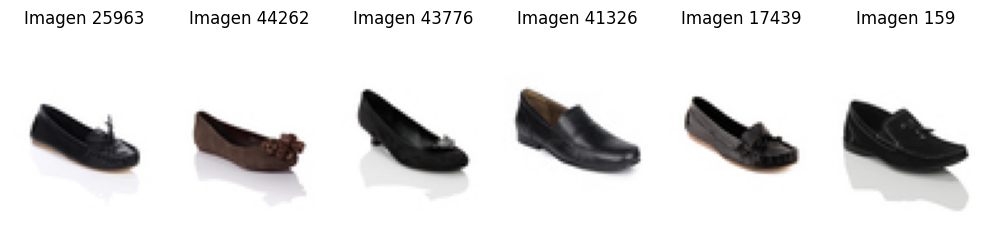

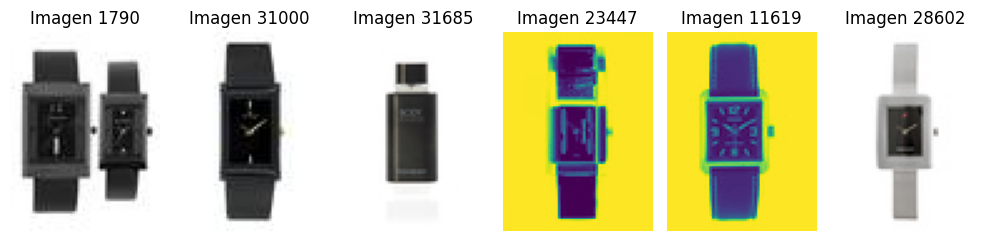

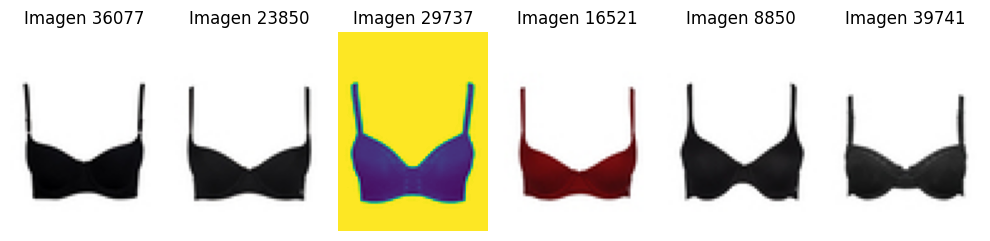

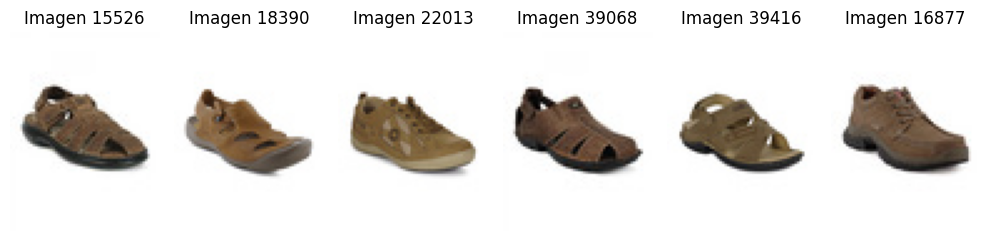

In [111]:
idxs_list = [random.randint(0, 40000) for x in range(0,20)]
for idxs in idxs_list:
    evaluar_idx_2(index_45, idxs, verbose=0)

#### **Verificar con imágenes externas.**


La función `extract_combined_features` carga una imagen, la preprocesa para ResNet y EfficientNet, obtiene las predicciones de características de cada modelo, y luego combina y normaliza los resultados para obtener un vector de características combinadas.

La función `evaluar_img_path_Annoy` evalúa un índice Annoy para encontrar los vecinos más cercanos a una imagen de consulta. Primero, verifica si la ruta de la imagen es una URL y la descarga si es necesario. Luego, extrae las características combinadas de la imagen de consulta utilizando la función anterior, y utiliza el índice Annoy para encontrar los vecinos más cercanos. Finalmente, muestra las imágenes de los vecinos más cercanos en una cuadrícula junto con la imagen de consulta.

In [62]:
def extract_combined_features(img_path, resnet_model, efnet_model, verbose='auto'):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    expand_img = np.expand_dims(img_array, axis=0)
    preprocessed_img_resnet = resnet50.preprocess_input(expand_img)
    preprocessed_img_efnet = efficientnet.preprocess_input(expand_img)
    result_resnet = resnet.predict(preprocessed_img_resnet, verbose=verbose)
    result_efnet = efnet.predict(preprocessed_img_efnet, verbose=verbose)
    combined_result = np.mean([result_resnet, result_efnet], axis=0)
    flatten_result = combined_result.flatten()
    result_normalized = flatten_result / norm(flatten_result)
    return result_normalized

def evaluar_img_path_Annoy(img_path_or_url, index, vectors, img_paths, n_neighbors=6, verbose='auto'):
    if img_path_or_url.startswith('http://') or img_path_or_url.startswith('https://'):
        img_path = '/content/downloaded_image.jpg'
        download_image_from_url(img_path_or_url, img_path)
    else:
        img_path = img_path_or_url
    vector_query = extract_combined_features(img_path, resnet, efnet, verbose)
    nearest_neighbors = index.get_nns_by_vector(vector_query, n_neighbors)
    if (verbose !=0):
        print("Vecinos más cercanos: ", nearest_neighbors)
    num_cols = n_neighbors + 1  # Incrementar el número de columnas para incluir la imagen externa
    num_rows = (n_neighbors + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5))
    ax = axes.flat[0]
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title("Imagen Externa")
    ax.axis('off')
    for i, ax in zip(nearest_neighbors, axes.flat[1:]):  # Empezar desde el segundo subplot
        img = mpimg.imread(img_paths[i])
        ax.imshow(img)
        ax.set_title(f"Imagen {i}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [98]:
url_externas = [
    'https://6a276aa43b.cbaul-cdnwnd.com/1d953a797f9b6c556bf396c55f1eb7e6/system_preview_detail_200000470-66a59689ab-public/aretes-largos-chapa-de-oro-filigrana.jpg',
    'https://locatelcolombia.vtexassets.com/arquivos/ids/342195/image-dac41845770346efbc227c4919f9a737.jpg?v=638240841801200000',
    'https://studiofco.vteximg.com.br/arquivos/ids/1505996-4000-4284/-stfco-producto-Bolsosycarteras-NEGRO-S402331-1.jpg?v=638276301885930000',
    'https://mariohernandez.vtexassets.com/arquivos/ids/213954/zapatos-garcia-negro-premium_1.jpg?v=637920274644600000',
    'https://frutocuatro.com/wp-content/uploads/2018/05/camiseta-64000-royal-frente.jpg',
    'https://ae01.alicdn.com/kf/H79810c2f4d8e4dd581015560c783e224f/Playa-vestidos-rectos-Mujer-volantes-vestido-Casual-de-verano-las-mujeres-vestido-de-hombro-cuello-barra.jpg',
    'https://www.puntoblanco.co/dx/api/dam/custom/2023/pbc/es-co/imagenes/hombres/medias/silli/566x715/medias-hombre-silli-rojo-347-frente-punto-blanco.jpg',
    'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRl8QnQZtMFc4a4Zb8fix2YheBKBsxbXPkNngCB9Uee7g&s',
    'https://cdn.baguer.co/uploads/2023/01/gafa-de-sol-para-mujer-redonda-con-estuche-derek-cafe-821285CF.jpg_cI0dXATpAMf5jQvrmI9W6fsunH036Tqj1bEXN8SlP2qI53H9tc.jpg',
    'https://falabella.scene7.com/is/image/FalabellaPE/19780023_1?wid=800&hei=800&qlt=70',
    'https://st.depositphotos.com/1364311/2242/i/450/depositphotos_22424641-stock-photo-red-lipstick.jpg',
    'https://libur.com.co/cdn/shop/files/rwerm.jpg?v=1711046822&width=600'
]

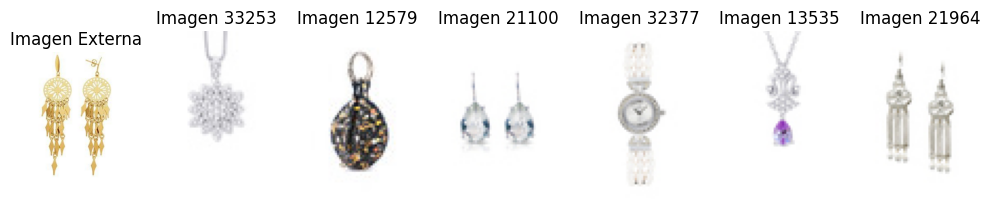

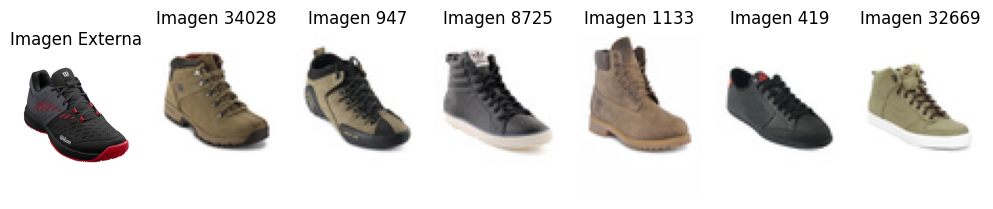

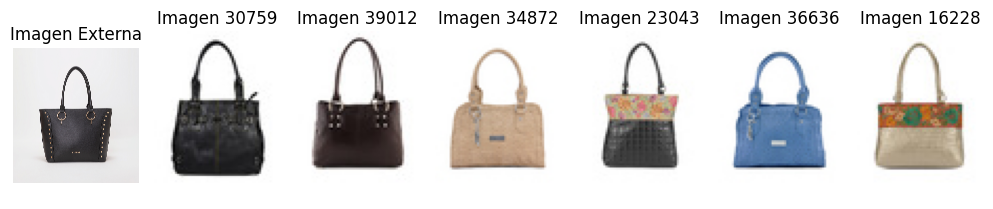

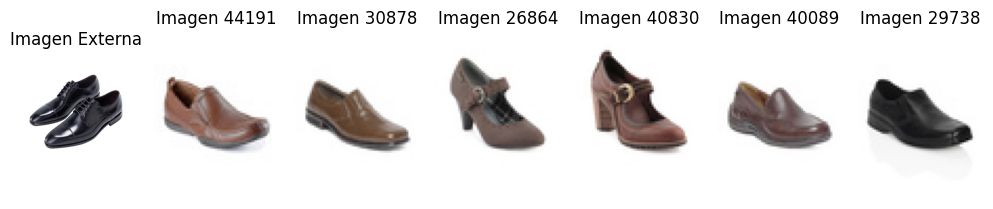

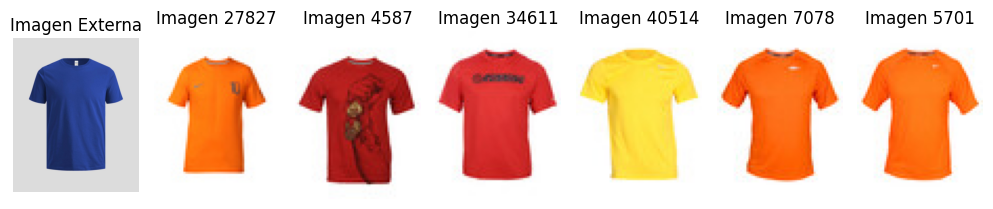

...

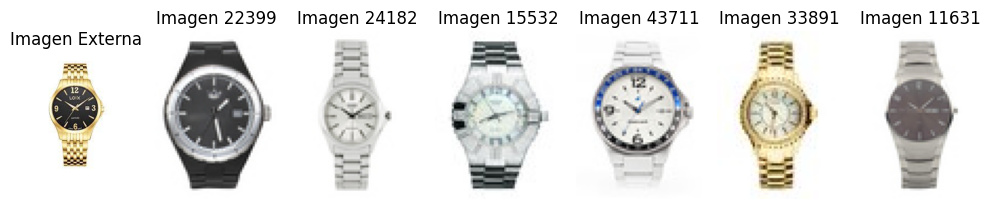

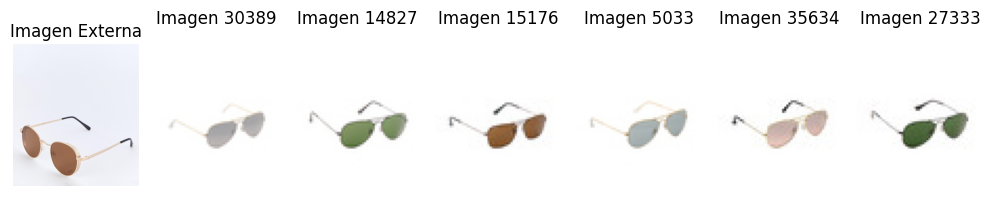

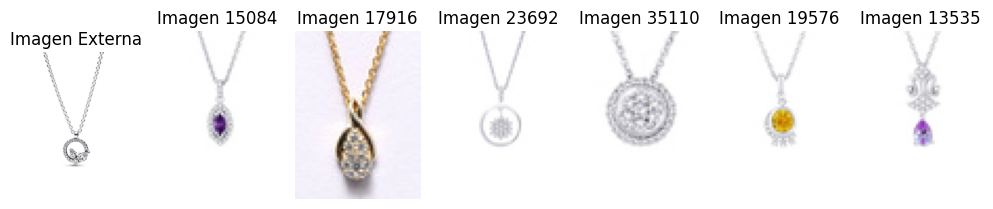

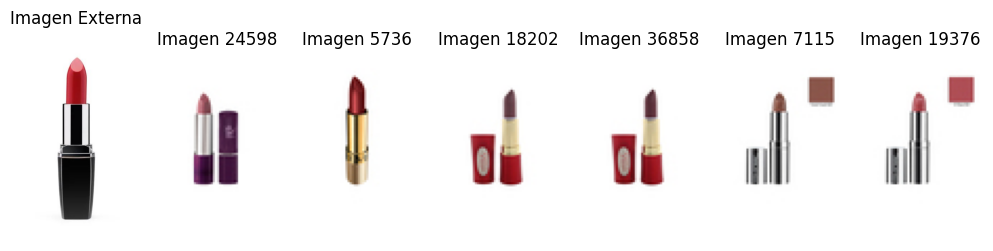

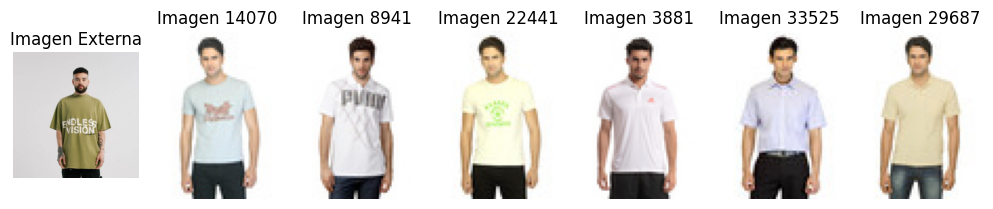

In [112]:
for url in url_externas:
    evaluar_img_path_Annoy(url, index_45, img_vector_2, img_files, verbose=0)

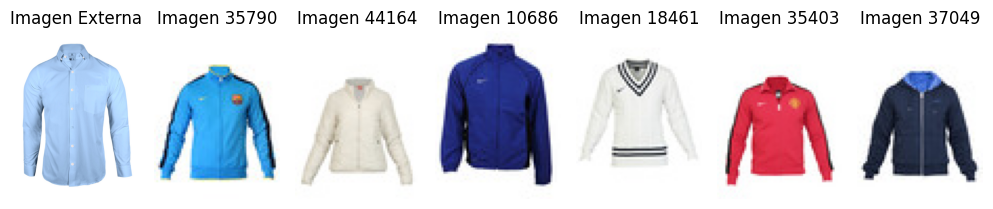

In [113]:
# @title ¡Prueba con tu imagen!
img_path = "https://monarca.com.co/wp-content/uploads/2023/11/016445DELBLU.jpg" # @param {type:"string"}
evaluar_img_path_Annoy(img_path, index_45, img_vector_2, img_files, verbose=0)

### **Annoy de 60**

Se construye el índice especificando el número de árboles que se utilizarán para la búsqueda. En este caso, se han utilizado 60 árboles para construir el índice.

In [114]:
dimension = len(img_vector_2[0])
index_60 = AnnoyIndex(dimension, 'euclidean')
for i, vector in enumerate(img_vector_2):
    index_60.add_item(i, vector)
index_60.build(60)

True

In [117]:
#index_60.save('/content/drive/MyDrive/proyecto_vision/index_60.ann')

True

#### **Verificar con imágenes del dataset.**

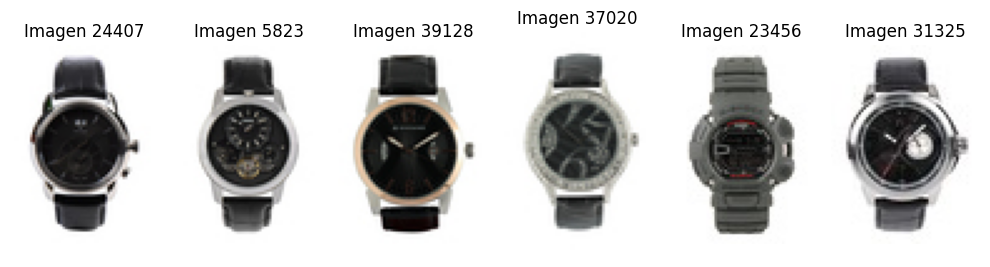

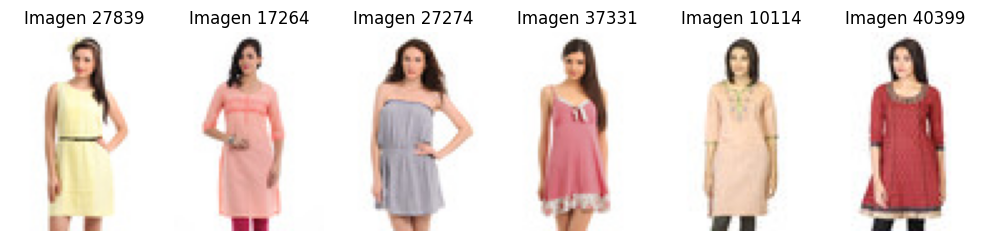

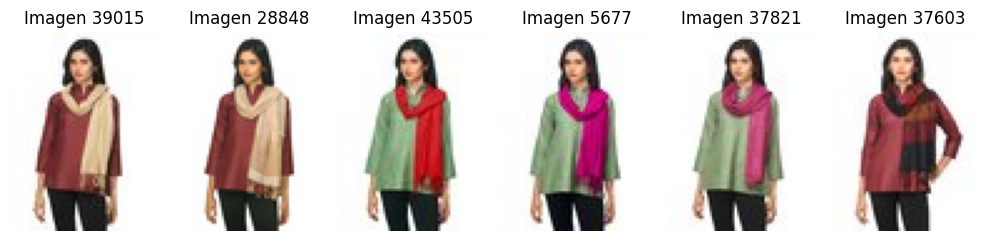

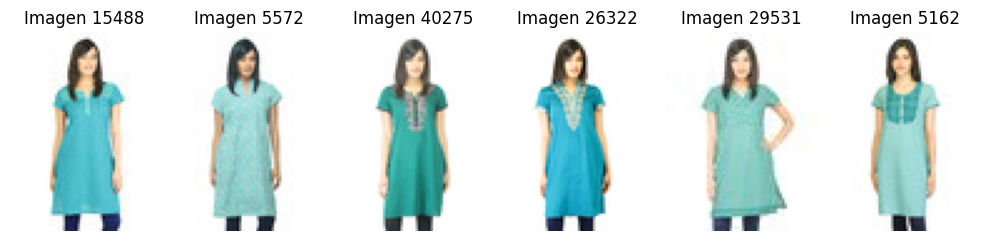

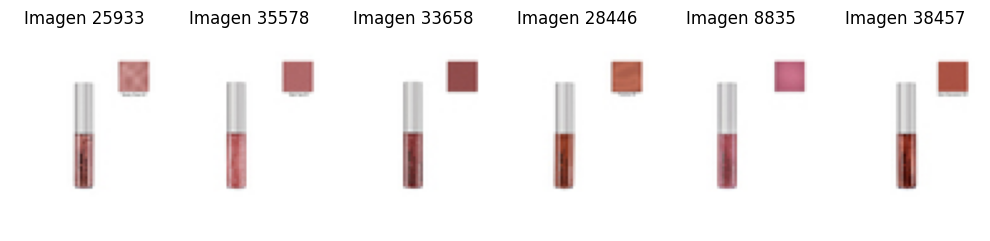

...

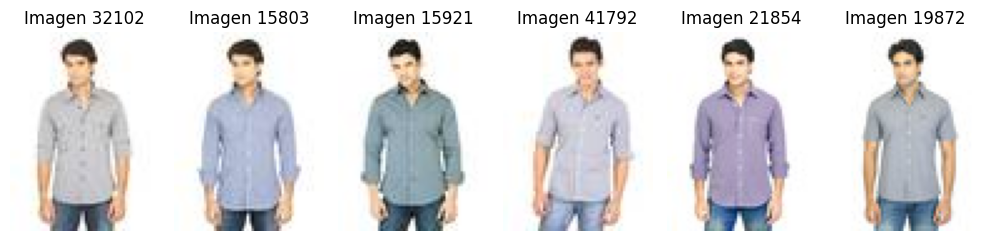

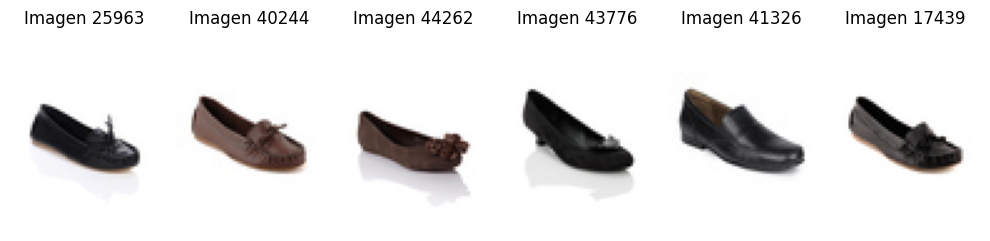

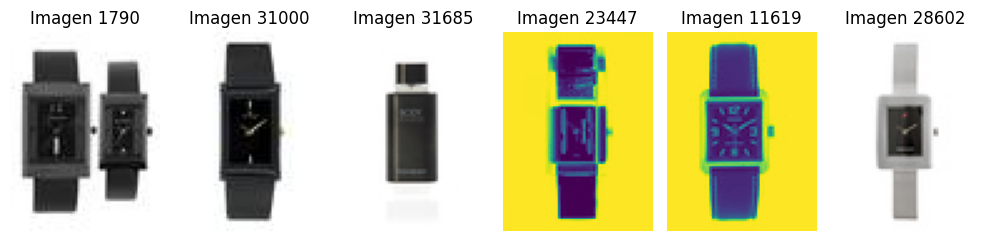

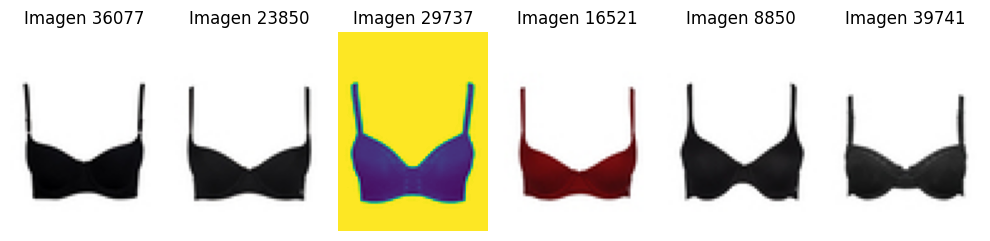

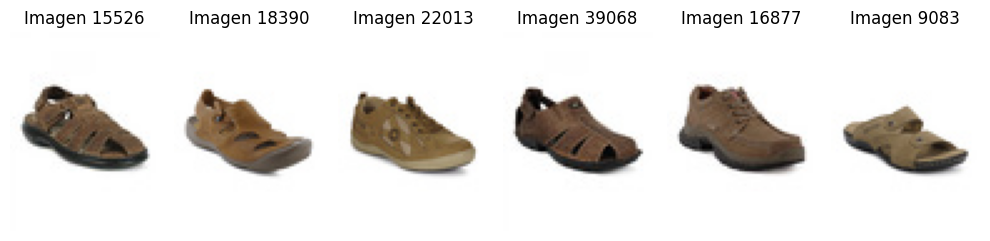

In [115]:
for idxs in idxs_list:
    evaluar_idx_2(index_60, idxs, verbose=0)

#### **Verificar con imágenes externas.**

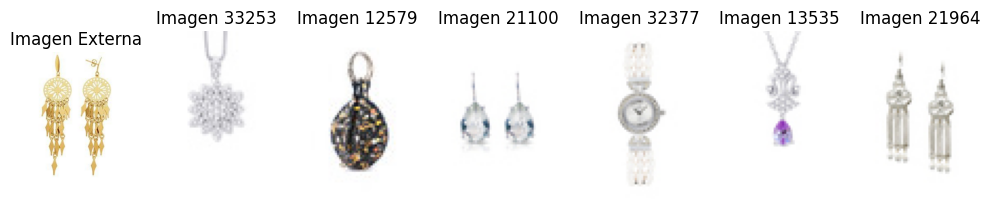

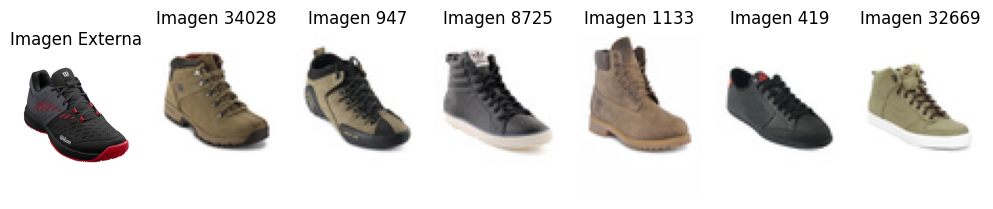

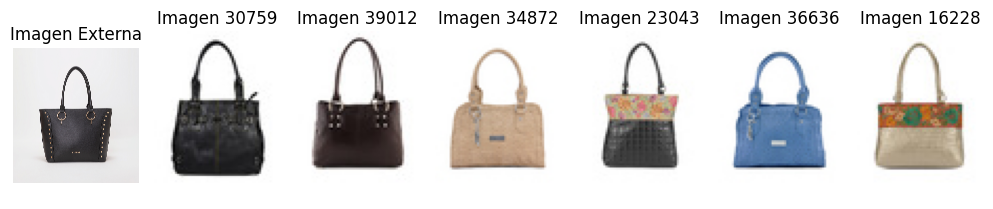

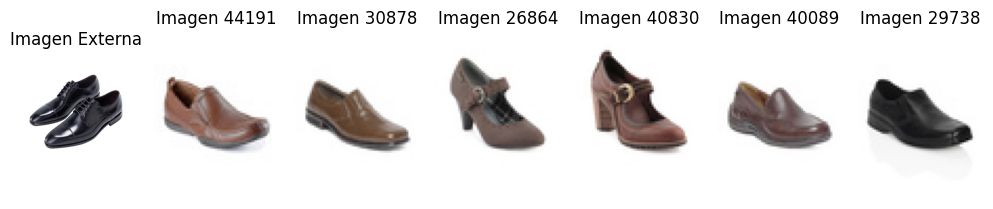

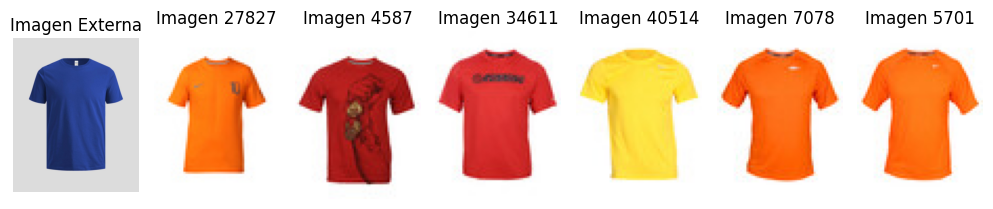

...

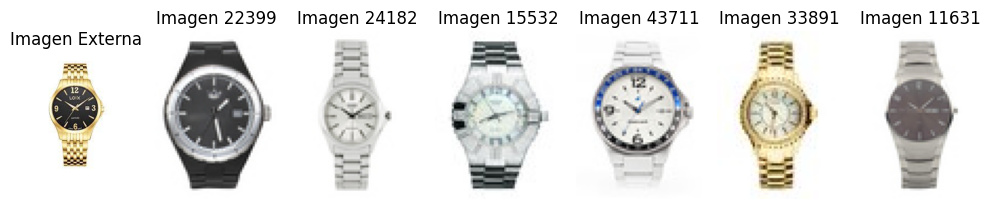

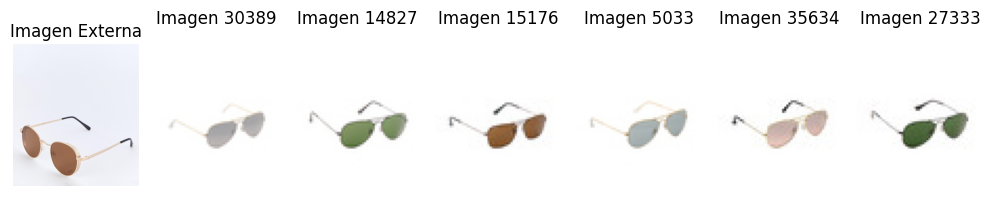

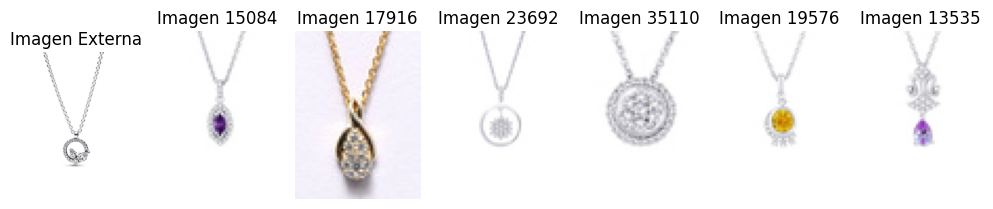

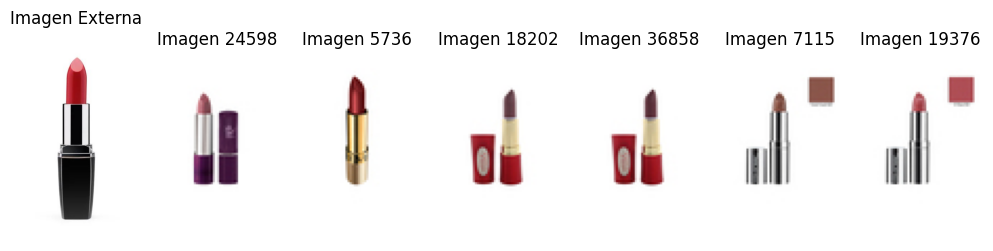

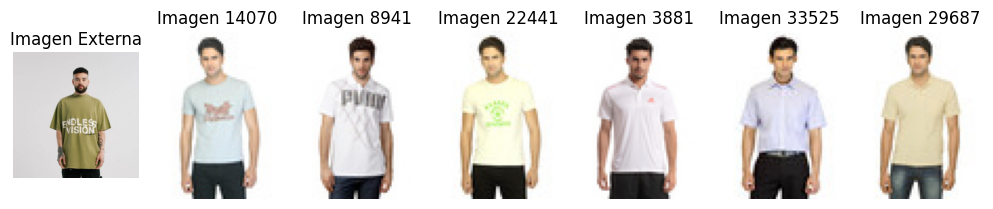

In [116]:
for url in url_externas:
    evaluar_img_path_Annoy(url, index_60, img_vector_2, img_files, verbose=0)

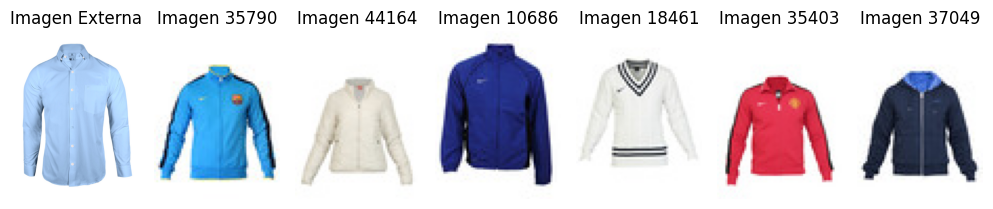

In [118]:
# @title ¡Prueba con tu imagen!
img_path = "https://monarca.com.co/wp-content/uploads/2023/11/016445DELBLU.jpg" # @param {type:"string"}
evaluar_img_path_Annoy(img_path, index_60, img_vector_2, img_files, verbose=0)

### **Annoy de 1000**

Se construye el índice especificando el número de árboles que se utilizarán para la búsqueda. En este caso, se han utilizado 60 árboles para construir el índice.

In [ ]:
dimension = len(img_vector_2[0])
index_1000 = AnnoyIndex(dimension, 'euclidean')
for i, vector in enumerate(img_vector_2):
    index_1000.add_item(i, vector)
index_1000.build(1000)

In [120]:
#index_1000.save('/content/drive/MyDrive/proyecto_vision/index_1000.ann')

True

#### **Verificar con imágenes del dataset.**

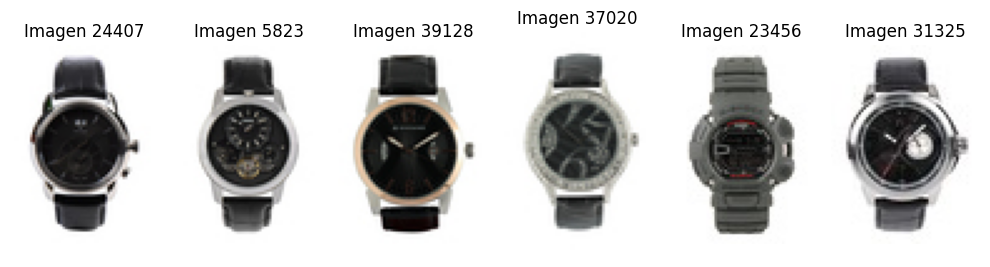

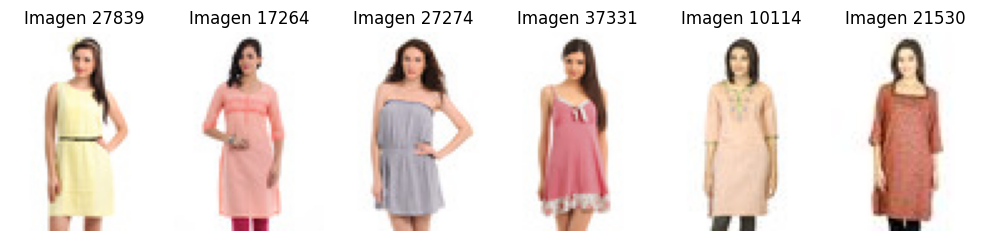

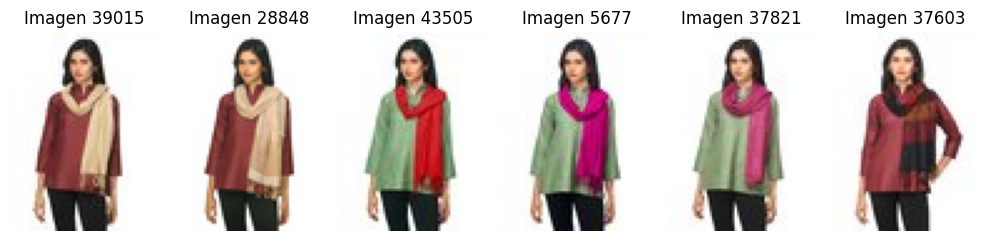

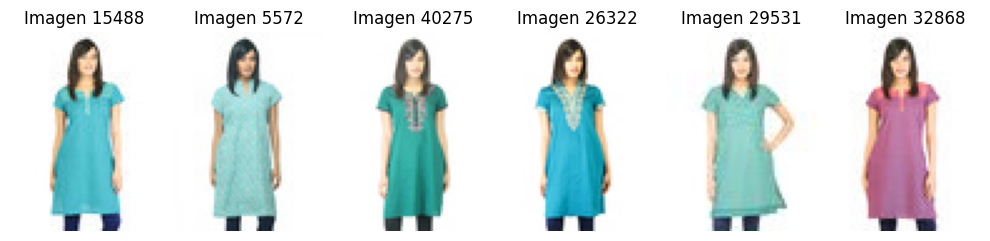

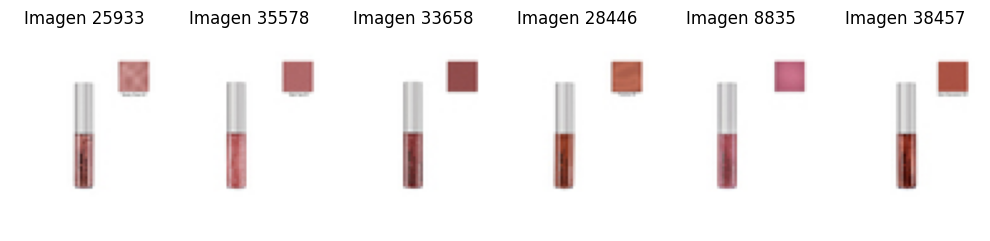

...

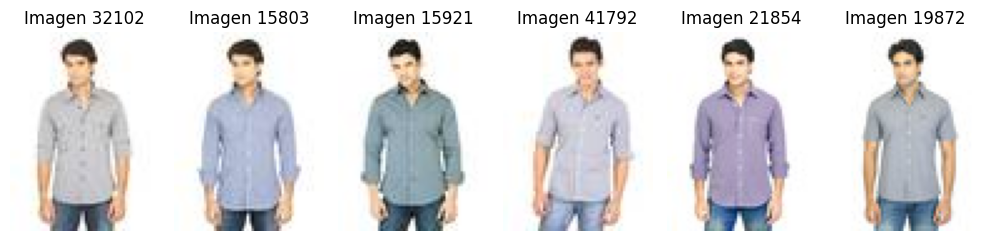

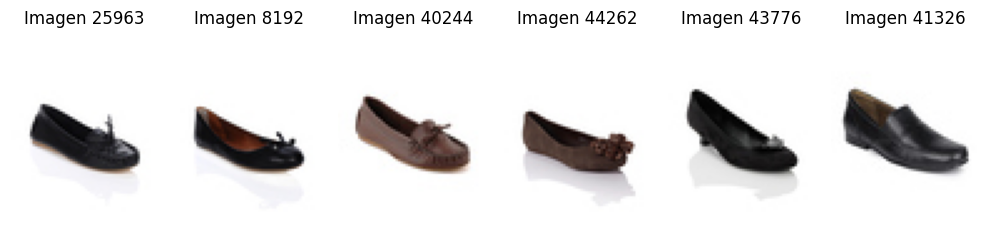

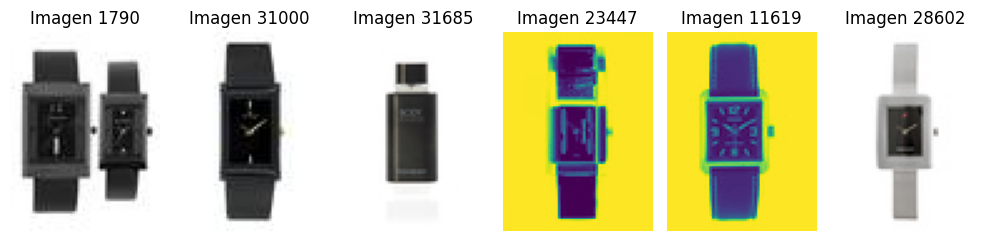

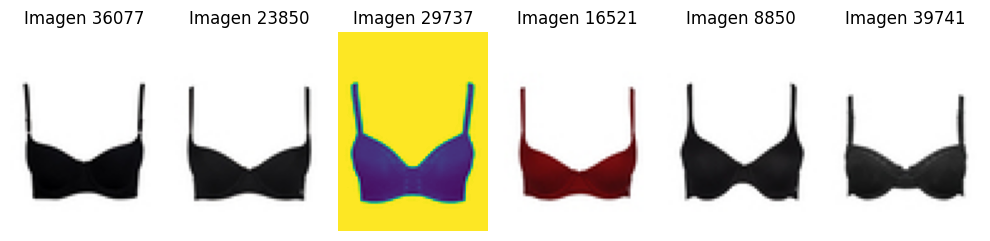

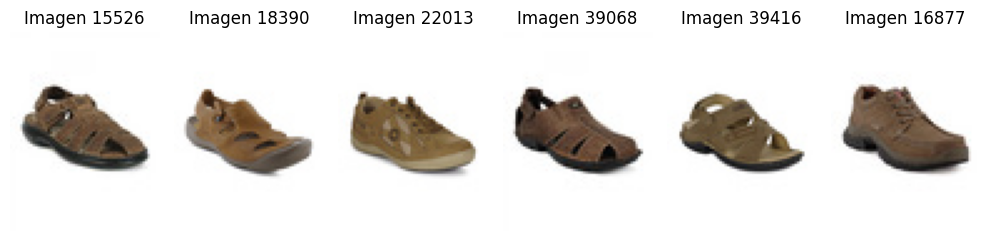

In [121]:
for idxs in idxs_list:
    evaluar_idx_2(index_1000, idxs, verbose=0)

#### **Verificar con imágenes externas.**

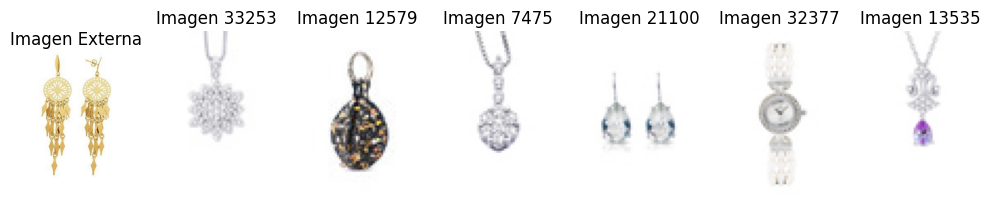

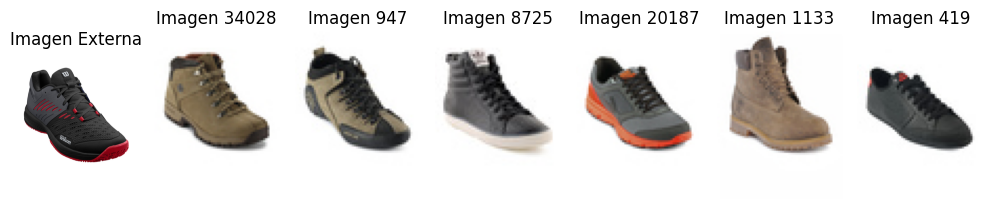

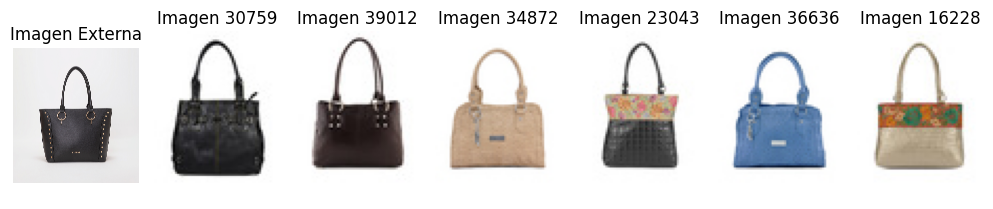

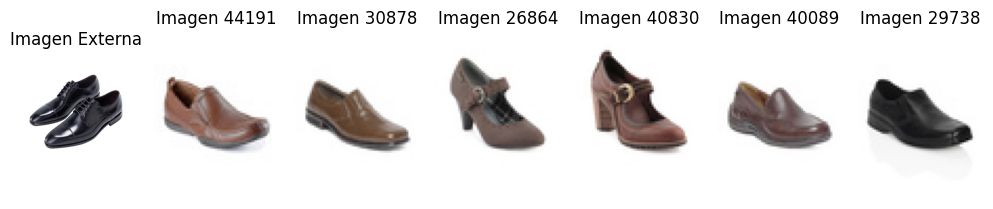

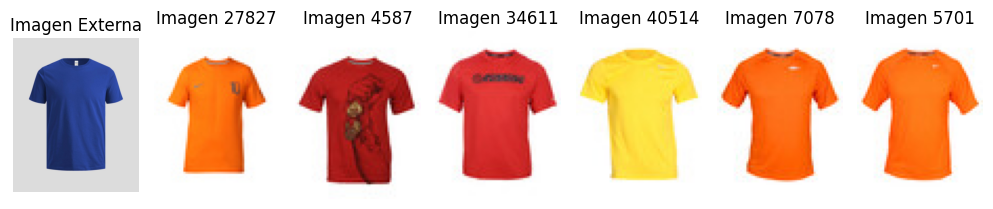

...

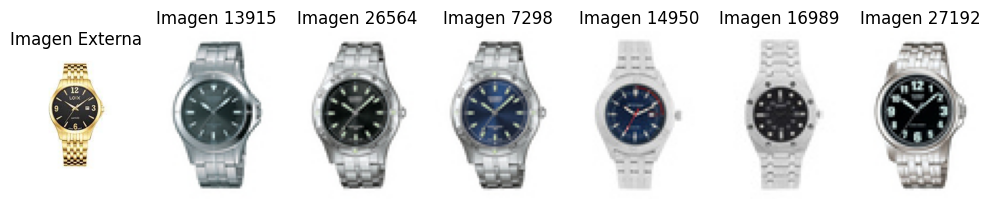

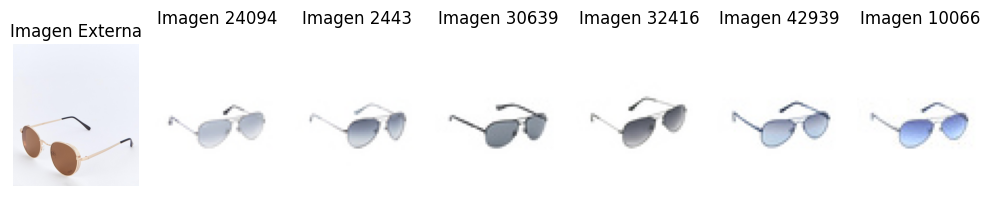

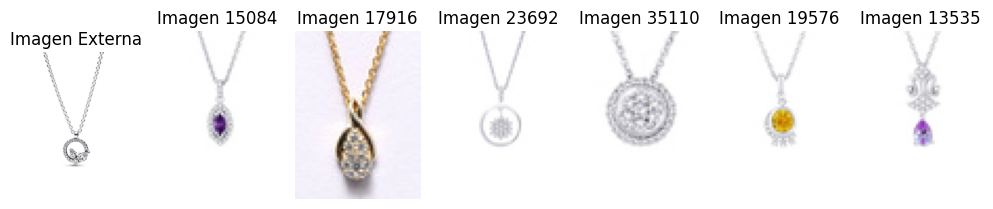

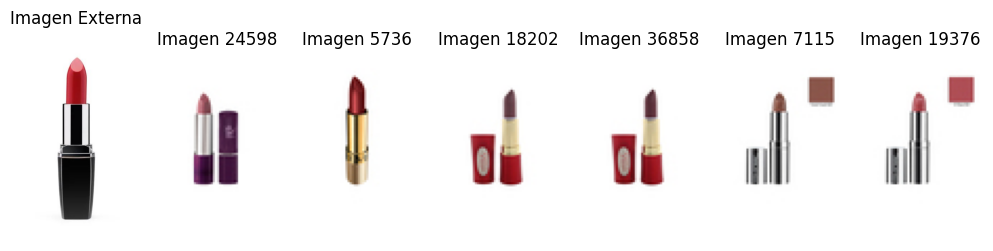

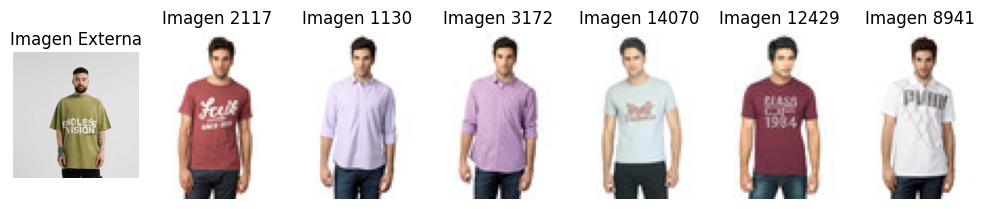

In [122]:
for url in url_externas:
    evaluar_img_path_Annoy(url, index_1000, img_vector_2, img_files, verbose=0)

In [ ]:
# @title ¡Prueba con tu imagen!
img_path = "https://monarca.com.co/wp-content/uploads/2023/11/016445DELBLU.jpg" # @param {type:"string"}
evaluar_img_path_Annoy(img_path, index_1000, img_vector_2, img_files, verbose=0)